In [1]:
from numpy import array
from keras.preprocessing.text import one_hot
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers.core import Activation, Dropout, Dense
from keras.layers import Flatten, LSTM
from keras.layers import GlobalMaxPooling1D
from keras.models import Model
from keras.layers.embeddings import Embedding
from sklearn.model_selection import train_test_split
from keras.preprocessing.text import Tokenizer
from keras.layers import Input
from keras.layers.merge import Concatenate

import pandas as pd
import numpy as np
import re

import matplotlib.pyplot as plt

Using TensorFlow backend.


In [2]:
toxic_comments = pd.read_csv('biased_data.csv')

In [3]:
print(toxic_comments.shape)
toxic_comments.head()

(494196, 6)


,review,rating1,rating2,rating3,rating4,rating5
0,Contains some interesting stitches.,0,0,0,1,0
1,I'm a fairly experienced knitter of the one-co...,0,0,0,0,1
2,Great book but the index is terrible. Had to w...,0,0,0,1,0
3,I purchased the Kindle edition which is incred...,0,0,0,0,1
4,Very well laid out and very easy to read.\n\nT...,0,0,0,0,1


In [4]:
filter = toxic_comments["review"] != ""
toxic_comments = toxic_comments[filter]
toxic_comments = toxic_comments.dropna()

In [5]:
print(type(toxic_comments["review"]))

<class 'pandas.core.series.Series'>


In [6]:
toxic_comments_labels = toxic_comments[['rating1','rating2','rating3','rating4','rating5']]
toxic_comments_labels.head()

,rating1,rating2,rating3,rating4,rating5
0,0,0,0,1,0
1,0,0,0,0,1
2,0,0,0,1,0
3,0,0,0,0,1
4,0,0,0,0,1


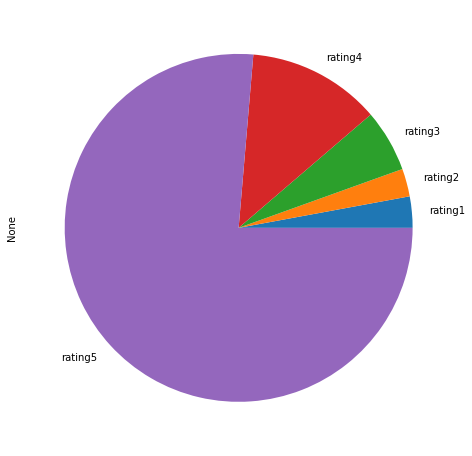

In [7]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 10
fig_size[1] = 8
plt.rcParams["figure.figsize"] = fig_size
toxic_comments_labels.sum(axis=0).plot.pie()

In [16]:
def preprocess_text(sen):
    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sen)

    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)

    # Removing multiple spresultaces
    sentence = re.sub(r'\s+', ' ', sentence)

    return sentence

In [17]:
X = []
sentences = list(toxic_comments["review"])
for sen in sentences:
    X.append(preprocess_text(sen))

y = toxic_comments_labels.values

In [18]:
X[9]

'Just received this book and looked over it cover to cover Each pattern has written and charted instructions and the photos are lovely The book contains Textured Knit and Purl Patterns Lace and Openwork Patterns Cables and Crossed Stitch Patterns Slip Stitch Patterns and Novelty Stitch Patterns There is also information on shaping knits within pattern stitches designing projects worked in the round and other basic design info at the front of the book In the back of the book there are illustrations and instructions for knitting techniques the abbreviations symbols There are pages total but the book isn so big that it shouldn fit into your knitting bag While there are some stitch patterns have seen before there are enough new to me stitches to make this worth the purchase am very happy with it and can wait to start swatching '

In [19]:
toxic_comments_labels.values

array([[0, 0, 0, 1, 0],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 1, 0],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 1, 0],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 1, 0, 0, 0],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 1, 0],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 1, 0, 0],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 1, 0, 0],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 1, 0],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0,

In [20]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [13]:
print(x_train[7])

I have been searching for manageable crafting tool for while now ve looked at full size Dremel tools and small drills and nothing seemed to be what was looking for do most of my crafting on my living room coffee table so it was important that it not be noisy The other tools were either powerful but too heavy for me or light weight and not powerful enough This little beauty is perfect It only comes with few drill bits but you can also get an accessory kit with sanding disks and buffers and such for not much more The handle is soft and easy on your hands think this may be unfairly branded as woman tool but it really perfect for anyone who wants to do close work and doesn want to pull out something that is too large for the job highly recommend this item data hook product link linked class link normal href Designed For Her Creative Rotary Tool Accessory Pack dp N VHK ref cm cr arp rvw txt ie UTF Designed For Her Creative Rotary Tool Accessory Pack 


In [32]:
tokenizer = Tokenizer(num_words=5000)
tokenizer.fit_on_texts(x_train)

x_train = tokenizer.texts_to_sequences(x_train)
x_test = tokenizer.texts_to_sequences(x_test)

vocab_size = len(tokenizer.word_index) + 1

maxlen = 200

x_train = pad_sequences(x_train, padding='post', maxlen=maxlen)
x_test = pad_sequences(x_test, padding='post', maxlen=maxlen)

KeyboardInterrupt: 

In [15]:
x_train[0]

array([   6,   89,   49,   12,    9,   97,  171,  170,  159, 1802,   32,
       3396,  379, 2811,   12,   47,   15,    4,  110,    2,   12,   55,
        218,  273,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,   

In [16]:
from numpy import array
from numpy import asarray
from numpy import zeros

embeddings_dictionary = dict()

glove_file = open('glove.6B.100d.txt', encoding="utf8")

for line in glove_file:
    records = line.split()
    word = records[0]
    vector_dimensions = asarray(records[1:], dtype='float32')
    embeddings_dictionary[word] = vector_dimensions
glove_file.close()

embedding_matrix = zeros((vocab_size, 100))
for word, index in tokenizer.word_index.items():
    embedding_vector = embeddings_dictionary.get(word)
    if embedding_vector is not None:
        embedding_matrix[index] = embedding_vector

In [29]:
import sys
import os
from RMDL_2 import text_feature_extraction as txt
from keras.datasets import imdb
import numpy as np
from RMDL_2 import RMDL_Text.py as RMDL

SyntaxError: invalid syntax (<ipython-input-29-33a77a1f4c48>, line 6)

In [15]:
batch_size = 100
sparse_categorical = 0
n_epochs = [25,25,25]  ## DNN--RNN-CNN
Random_Deep = [3, 3, 3]  ## DNN--RNN-CNN

RMDL.Text_Classification(x_train, y_train, x_test, y_test,
                     batch_size=batch_size,
                     sparse_categorical=sparse_categorical,
                     random_deep=Random_Deep,
                     epochs=n_epochs,MAX_SEQUENCE_LENGTH = 200, MAX_NB_WORDS = 5000,)

Done1
.\Glove/glove.6B.zip


KeyboardInterrupt: 

In [ ]:
deep_inputs = Input(shape=(maxlen,))
embedding_layer = Embedding(vocab_size, 100, weights=[embedding_matrix], trainable=False)(deep_inputs)
LSTM_Layer_1 = LSTM(128)(embedding_layer)
dense_layer_1 = Dense(5, activation='softmax')(LSTM_Layer_1)
model = Model(inputs=deep_inputs, outputs=dense_layer_1)
8
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc'])

In [ ]:
print(model.summary())

In [ ]:
history = model.fit(x_train, y_train, batch_size=128, epochs=5, verbose=1, validation_split=0.2)

In [ ]:
score = model.evaluate(x_test, y_test, verbose=1)

print("Test Score:", score[0])
print("Test Accuracy:", score[1])

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])

plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper left')
plt.show()

In [ ]:
model.save('nlp86')

In [ ]:
senpets = "Whiskers are missing. Looks cute in picture more than in real. Not very good but okay type product. Does not come in box."

In [ ]:
xp = [preprocess_text(senpets)]

In [ ]:
xp

In [ ]:
x_trainp = np.array(xp)

In [ ]:
x_trainp

In [ ]:
tokenizer = Tokenizer(num_words=5000)
tokenizer.fit_on_texts(x_train)

x_trainp = tokenizer.texts_to_sequences(x_trainp)

vocab_size = len(tokenizer.word_index) + 1

maxlen = 200

x_trainp = pad_sequences(x_trainp, padding='post', maxlen=maxlen)

In [ ]:
x_trainp

In [ ]:
result = model.predict(x_trainp)

In [ ]:
result